In [1]:
# Step 1: Install required packages
%pip install "ultralytics>=8.3.40" opencv-python ipython nest_asyncio ipywidgets
!yolo settings sync=False  # disable Ultralytics tracking

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 79.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 92.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
  

In [ ]:
# ✅ Install Required Packages
%pip install "ultralytics>=8.3.40" opencv-python ipython ipywidgets nest_asyncio

In [2]:
!pip install gradio ultralytics opencv-python


✅ Model loaded from: /content/best (12).pt
📁 Please upload an image (e.g., .jpg, .png)


Saving bugs_008.jpg to bugs_008.jpg

0: 640x384 4 Aphids_Bugss, 1 Thrips-Bugs, 301.7ms
Speed: 4.4ms preprocess, 301.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)


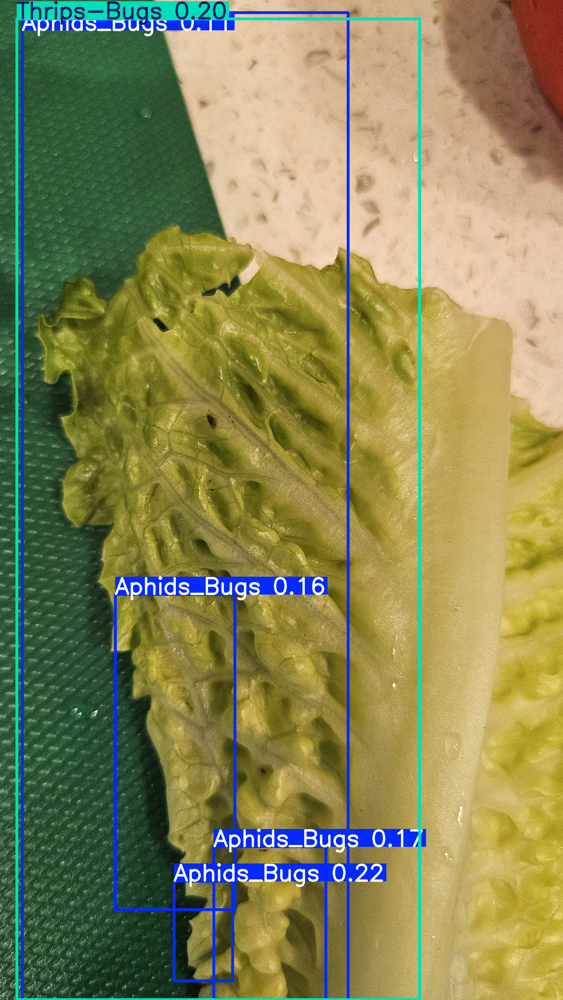

💾 Saved: detected_bugs_008.jpg


In [17]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow
from google.colab import files

# ✅ Model is already uploaded and saved at /content/best (12).pt
model_path = "/content/best (12).pt"
model = YOLO(model_path)
print(f"✅ Model loaded from: {model_path}")

# ✅ Upload image
print("📁 Please upload an image (e.g., .jpg, .png)")
uploaded_img = files.upload()
img_path = list(uploaded_img.keys())[0]

# ✅ Read the image
img = cv2.imread(img_path)

# ✅ Run detection
results = model.predict(img, conf=0.1)
annotated = results[0].plot()

# ✅ Display result
cv2_imshow(annotated)

# ✅ Save result
output_path = f"detected_{img_path}"
cv2.imwrite(output_path, annotated)
print(f"💾 Saved: {output_path}")


In [3]:
import gradio as gr
import cv2
from ultralytics import YOLO
import numpy as np
import os

# ✅ Load YOLO model
model_path = "/content/best (12).pt"
model = YOLO(model_path)

def detect_yolo(img):
    # Convert PIL image to OpenCV format
    img_bgr = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)

    # Predict
    results = model.predict(img_bgr, conf=0.1)
    annotated = results[0].plot()

    # Save
    filename = "detected_output.jpg"
    cv2.imwrite(filename, annotated)

    # Convert BGR to RGB for display
    img_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return img_rgb

with gr.Blocks() as app:
    gr.Markdown("## 🧠 YOLO Detection App")
    with gr.Row():
        image_input = gr.Image(type="pil", label="📤 Upload Image")
        image_output = gr.Image(label="✅ Detected Output")

    with gr.Row():
        btn_detect = gr.Button("🔍 Detect")
        btn_exit = gr.Button("❌ Exit")

    # Define actions
    btn_detect.click(fn=detect_yolo, inputs=image_input, outputs=image_output)
    btn_exit.click(fn=lambda: os._exit(0), inputs=[], outputs=[])

# 🔁 Launch app
app.launch()


It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://de7acf6456ff467c9f.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
